In [1]:
import starry
import matplotlib.pyplot as plt
import numpy as np
import pymc3 as pm
import pymc3.math as pmm
import pymc3_ext as pmx
import exoplanet
from starry_process import StarryProcess, MCMCInterface
from starry_process.math import cho_factor, cho_solve
import starry_process 
import theano
import aesara_theano_fallback.tensor as tt
from theano.tensor.slinalg import cholesky
from corner import corner
import arviz as az
from matplotlib.colors import Normalize
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import os
from tqdm import tqdm
import emcee
import ptemcee

starry.config.quiet = True
np.random.seed(1)

WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (theano.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
/opt/anaconda3/envs/starry-env/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Helper functions

In [2]:
def Inclination(name, testval=30):
    """
    An isotropic distribution for inclination angles (in degrees).
    
    """
    def logp(x):
        return tt.log(np.pi / 180 * tt.sin(x * np.pi / 180))

    def random(*args, **kwargs):
        return tt.arccos(pm.Uniform.dist(0, 1).random(*args, **kwargs)) * 180 / np.pi

    return pm.DensityDist(
        name,
        logp,
        random=random,
        testval=testval,
    )


def Angle(*args, **kwargs):
    """
    A uniform distribution for angles in [-180, 180).
    
    """
    if kwargs.get("testval", None) is not None:
        kwargs["testval"] *= np.pi / 180
    return 180 / np.pi * pmx.Angle(*args, **kwargs)


# Shorthand for the usual Uniform distribution
Uniform = pm.Uniform

In [3]:
def generate(t, params, seed=1, error=1e-3, visualize=True):
    """
    Generate a synthetic light curve.
    
    """
    # Set up the system
    map = starry.Map(15, 2)
    map.inc = params["star.inc"]["truth"]
    map[1] = params["star.u1"]["truth"]
    map[2] = params["star.u2"]["truth"]
    star = starry.Primary(map, m=params["star.m"]["truth"]) # *** maybe also `r`
    planet = starry.Secondary(
        starry.Map(),
        inc=params["planet.inc"]["truth"],
        ecc=params["planet.ecc"]["truth"],
        Omega=params["planet.Omega"]["truth"],
        w=params["planet.w"]["truth"],
        porb=params["planet.porb"]["truth"],
        t0=params["planet.t0"]["truth"],
    )
    sys = starry.System(star, planet)
    xo, yo, zo = sys.position(t)
    xo = xo.eval()[1]
    yo = yo.eval()[1]
    zo = zo.eval()[1]
    
    # Get the flux design matrix
    theta = (360 * t / params["star.prot"]["truth"]) % 360
    A = map.design_matrix(
        theta=theta, xo=xo, yo=yo, zo=zo, ro=params["planet.r"]["truth"]
    ).eval()
    print(A.shape)
    
    # *** Draw 1 sample from the GP
    np.random.seed(seed)
    sp = StarryProcess(
        mu=params["gp.mu"]["truth"],
        sigma=params["gp.sigma"]["truth"],
        r=params["gp.r"]["truth"],
        c=params["gp.c"]["truth"],
        n=params["gp.n"]["truth"],
    )
    y = sp.sample_ylm().eval().reshape(-1)

    # Starry process Ylms are normalized so that they have
    # zero luminosity (i.e., a featureless star has Y_{0,0} = 0)
    # Let's renormalize it to unity, since that's the baseline
    # we want for transits
    y[0] += 1
    
    # Compute the light curve
    flux0 = A @ y


    mu_ylm = sp.mean_ylm
    mu_ylm = tt.inc_subtensor(mu_ylm[0], 1)
    mu_flux = tt.dot(A, mu_ylm)
    
    # Add photometric noise
    err = np.ones_like(flux0) * error
    flux = np.array(flux0)
    noise = np.random.randn(len(t)) * err
    flux += noise
    
    # *** Normalize the flux
    med_flux = np.median(flux)
    flux /= med_flux
    err /= med_flux
    
    # Visualize the system
    if visualize:
        fig, ax = plt.subplots(1, 2, figsize=(20, 8))
        idx = (zo > 0) | (xo ** 2 + yo ** 2 > 1)
        ax[0].plot(xo[idx], yo[idx], "k.", ms=1);
        ax[0].set_aspect(1)
        ax[0].axis("off")
        map[:, :] = y
        map.show(ax=ax[0])
        ax[0].set_ylim(-3, 3)
        idx = (zo > 0) & (xo ** 2 + yo ** 2 < 1)
        lat = 180 / np.pi * np.arcsin(yo[idx])
        lon = 180 / np.pi * np.arcsin(xo[idx] / np.sqrt(1 - yo[idx] ** 2)) - theta[idx]
        lon = (lon + 180) % 360 - 180
        mask = np.append(np.array(lon[1:] > lon[:-1], dtype=float), 0)
        mask[mask == 1] = np.nan
        map.show(ax=ax[1], projection="rect")
        ax[1].plot(lon, lat + mask, "k-");
    
    return flux, err, med_flux, mu_flux

Based on Hogg's notes: https://ui.adsabs.harvard.edu/abs/2020arXiv200514199H/abstract,
I have $$ln L_m = -\frac{1}{2} r_m^T \Sigma^{-1} r_m - \frac{1}{2}ln\vert\Sigma\vert - \frac{K}{2} ln(2\pi)$$
$$r_m = f_m - \mu$$
from eq. (19) and (20):
$$\vert\Sigma\vert = \vert\Sigma_d\vert \vert\Sigma_s\vert  \vert\Sigma_s^{-1}\vert \vert\Sigma_s A^T\Sigma_d^{-1} A+I\vert $$
$$\vert\Sigma\vert = \vert\Sigma_d\vert \vert\Sigma_s A^T\Sigma_d^{-1} A+I\vert$$
$$ln \vert\Sigma\vert = ln \vert\Sigma_d\vert + ln \vert\Sigma_s A^T\Sigma_d^{-1} A+I\vert$$
from eq. (24):
$$\Sigma^{-1} = \Sigma_d^{-1} - \Sigma_d^{-1} A (\Sigma_s^{-1}+A^T\Sigma_d^{-1}A)^{-1}A^T\Sigma_d^{-1}$$
$$\Sigma^{-1} = \Sigma_d^{-1} - \Sigma_d^{-1} A (I+\Sigma_s A^T\Sigma_d^{-1}A)^{-1}\Sigma_s A^T\Sigma_d^{-1}$$
$$U = I+\Sigma_s A^T\Sigma_d^{-1}A$$
$$\Sigma^{-1} = \Sigma_d^{-1} - \Sigma_d^{-1} A U^{-1}\Sigma_s A^T\Sigma_d^{-1}$$
$$Q = r_m^T \Sigma^{-1} r_m = r_m^T(\Sigma_d^{-1} - \Sigma_d^{-1} A \Sigma_s U^{-1}A^T\Sigma_d^{-1})r_m$$
$$v = A^T\Sigma_d^{-1}r_m = A^T r_m/\sigma^2$$
$$v^T = r_m^T\Sigma_d^{-1}A$$
$$Q = r_m^T\Sigma_d^{-1}r_m - v^T \Sigma_s U^{-1}v$$

In [4]:
def bin_out_of_transit(t, flux, err, params, dt=0.1, binsize=30):
    """
    Bin the out of transit points to speed things up.
    
    """
    # Find in-transit and out-of-transit points
    idx = np.zeros(len(t), dtype=bool)
    ntransits = int(np.ceil(t[-1] / params["planet.porb"]["truth"]))
    for n in range(ntransits):
        t0 = params["planet.t0"]["truth"] + n * params["planet.porb"]["truth"]
        idx |= ((t > t0 - dt) & (t < t0 + dt))
    t_in = t[idx]
    f_in = flux[idx]
    t_out = t[~idx]
    f_out = flux[~idx]

    # Make the size of the out-of-transit array divisible by binsize
    # so we can bin by simple array reshaping
    trim = len(t_out) % binsize
    t_out = t_out[:-trim]
    f_out = f_out[:-trim]

    # We need to be careful not to bin *across* the transit, so
    # let's NaN-out points right _before_ each transit
    f_out[np.where(np.diff(t_out) > 0.1)] = np.nan

    # Bin the out-of-transit data
    t_out = t_out.reshape(-1, binsize).mean(axis=1)
    f_out = f_out.reshape(-1, binsize).mean(axis=1)

    # Remove any nans (the averages *across* transits)
    idx = np.isnan(f_out)
    t_out = t_out[~idx]
    f_out = f_out[~idx]

    # Error arrays
    e_in = err[0] * np.ones_like(t_in)
    e_out = (err[0] / np.sqrt(binsize)) * np.ones_like(t_out)

    # Sort and merge the arrays
    t_ = np.concatenate((t_in, t_out))
    f_ = np.concatenate((f_in, f_out))
    e_ = np.concatenate((e_in, e_out))
    idx = np.argsort(t_)
    t_ = t_[idx]
    flux_ = f_[idx]
    err_ = e_[idx]

    return t_, flux_, err_

some linear algebra:
$$\Sigma_d^{-1}r_m = r_m\frac{1}{\sigma^2}$$
$$r_m^T\Sigma_d^{-1} = (r_m\frac{1}{\sigma^2})^T$$
$$r_m^T\Sigma_d^{-1}r_m = r_m^2/\sigma^2$$

Solving for mean and covariance of $f_{obs}$
$$m=1/\alpha$$
$$f_{obs} = f_{true}{\alpha}+\epsilon$$
$$f_{true} \sim \mathcal{N}(\mu,\Sigma)$$
$$\epsilon \sim \mathcal{N}(0,\sigma^2 I)$$
$$f_{obs} \sim \mathcal{N}(\frac{\mu}{m},\frac{\Sigma}{m^2}+\sigma^2I)$$
Now, I need to change $\Sigma$:
$$\tilde\Sigma^{-1} = (\frac{1}{m^2}\Sigma)^{-1} = m^2\Sigma^{-1}$$
$$\tilde Q = m^2 Q$$
$$ln\vert\tilde\Sigma\vert = ln\vert\frac{1}{m^2}\Sigma\vert = ln((\frac{1}{m^2})^n\vert\Sigma\vert) = -2n ln(m)+ ln\vert\Sigma\vert$$

In [5]:
def gp_model(t, flux, err, params):

    # Helper function to instantiate parameters
    def parameter(name):
        param = params[name]
        if param.get("free", False):
            args = param.get("args", [])
            kwargs = param.get("kwargs", {})
            testval = param.get("testval", param["truth"])
            return param["dist"](name, *args, testval=testval, **kwargs)
        else:
            return param["truth"]
    
    
    starry.config.lazy = True
    
    with pm.Model() as model:

        # Instantiate the system
        map = starry.Map(15, 2)
        map.inc = parameter("star.inc")
        map[1] = parameter("star.u1")
        map[2] = parameter("star.u2")
        star = starry.Primary(map, m=parameter("star.m")) # *** maybe also `r` for the star
        planet = starry.Secondary(
            starry.Map(),
            inc=parameter("planet.inc"),
            ecc=parameter("planet.ecc"),
            Omega=parameter("planet.Omega"),
            w=parameter("planet.w"),
            porb=parameter("planet.porb"),
            t0=parameter("planet.t0"),
        )
        sys = starry.System(star, planet)
        xo, yo, zo = sys.position(t)

        # Get the flux design matrix
        theta = (360 * t / parameter("star.prot")) % 360
        A = map.design_matrix(
            theta=theta,
            xo=xo[1], # *** these were wrong! [0] = star; [1] = planet
            yo=yo[1],
            zo=zo[1],
            ro=parameter("planet.r"),
        )

        # Instantiate the GP
        # sigma = pm.Uniform("sigma", 1.0, 10.0)
        sp = StarryProcess(
            mu=parameter("gp.mu"),
            sigma=parameter("gp.sigma"),
            # sigma=sigma,
            r=parameter("gp.r"),
            c=parameter("gp.c"),
            n=parameter("gp.n"),
            marginalize_over_inclination=False,  # *** we know the inclination
            normalized=False,  # *** we're modeling the normalization explicitly
        )
        norm = parameter("gp.norm")
        
        A = A / norm
        
        '''
        # Compute the flux covariance
        cov_ylm = sp.cov_ylm
        cov_flux = tt.dot(tt.dot(A, cov_ylm), tt.transpose(A)) / norm ** 2
        cov_flux += tt.diag(err) ** 2

        # Compute the flux mean; remember to offset Y_{0,0} by one
        mu_ylm = sp.mean_ylm
        mu_ylm = tt.inc_subtensor(mu_ylm[0], 1)
        mu_flux = tt.dot(A, mu_ylm) / norm

        # Marginal likelihood
        pm.MvNormal("marginal", mu=mu_flux, cov=cov_flux, observed=flux)
        '''
        Sigma_s = sp.cov_ylm 
        mu_ylm = sp.mean_ylm
        mu_ylm = tt.inc_subtensor(mu_ylm[0], 1)
        mu_flux = tt.dot(A, mu_ylm) #/ norm
        K = len(t)

        U = np.eye(256) +tt.dot(Sigma_s, tt.dot(A.T, A/tt.square(err[:,None])))

        log_sigmadet = 2*tt.sum(tt.log(err)) + pmm.logdet(U) 
        # log_sigmadet -= 2*256*tt.log(norm)

        r = tt.as_tensor_variable(flux) - mu_flux
        v = tt.dot(A.T,(r/tt.square(err)))
        Q = tt.sum(tt.square(r/err)) - tt.dot(v.T,tt.slinalg.solve(U,tt.dot(v,Sigma_s)))

        loglike = -0.5 * Q
        loglike -= 0.5  * log_sigmadet
        loglike -= 0.5 * K * tt.log(2 * np.pi)

        pm.Potential("lnlike", loglike)

        
        return model

## Generate a light curve

(1440, 256)


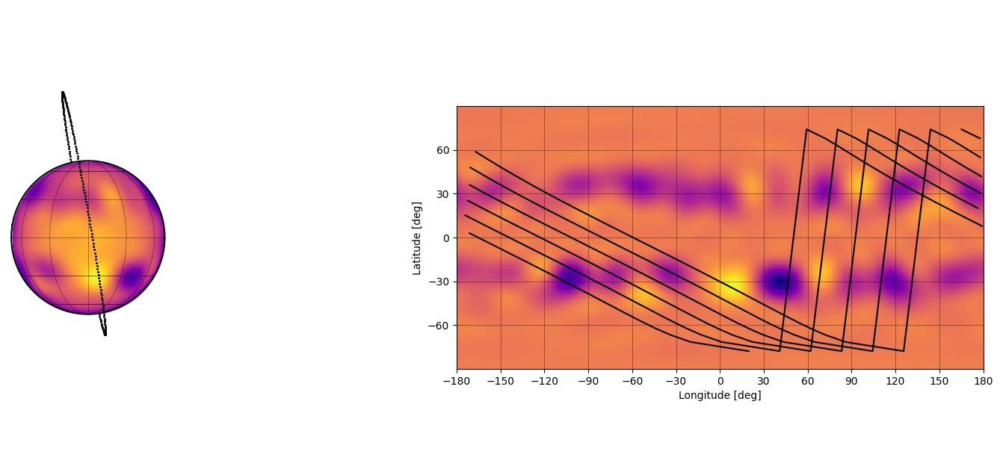

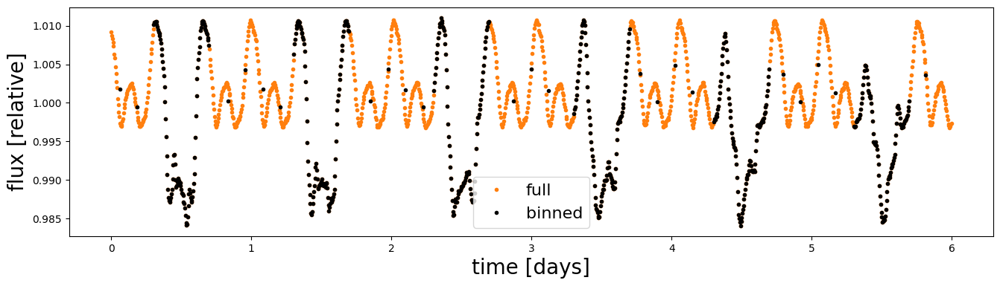

In [24]:
# *** True parameters & priors
params = {
    "planet.inc": {"truth": 88.0, "dist": Inclination},
    "planet.ecc": {"truth": 0.2, "dist": Uniform, "args": [0.19, 0.21]},
    "planet.Omega": {"truth": 100, "dist": Uniform, "args": [99,101]},
    "planet.w": {"truth": 0.0, "dist": Angle},
    "planet.porb": {"truth": 1.0, "dist": Uniform, "args": [0.995, 1.005]},
    "planet.t0": {"truth": 0.5, "dist": Uniform, "args": [0.495, 0.505]},
    "planet.r": {"truth": 0.1, "dist": Uniform, "args": [0.09, 0.11]},
    "star.inc": {"truth": 90, "dist": Inclination},
    "star.m": {"truth": 0.5, "dist": Uniform, "args": [0.4, 0.6]},
    "star.u1": {"truth": 0.4, "dist": Uniform, "args": [0.0, 0.6]},
    "star.u2": {"truth": 0.2, "dist": Uniform, "args": [0.0, 0.4]},
    "star.prot": {"truth": 0.34, "dist": pm.Uniform, "args": [0.1, 1.0]},
    "gp.r": {"truth": 10, "dist": Uniform, "args": [9.0, 11.0]},
    "gp.c": {"truth": 0.1, "dist": Uniform, "args": [0.09, 0.11]},
    "gp.n": {"truth": 20, "dist": Uniform, "args": [19, 21]},
    "gp.mu": {"truth": 30, "dist": Uniform, "args": [29, 31]},
    "gp.sigma": {"truth": 5, "dist": Uniform, "args": [4, 6]},
    "gp.norm": {"truth": 1, "dist": Uniform, "args": [0.9, 1.1]}
}

# *** Time array (6 days @ 6 min cadence)
t = np.arange(0, 6, 6 / 24 / 60)

# Get the light curve
flux, err, med_flux, mu_flux = generate(t, params, error=1e-4)

# Get the binned light curve
t_, flux_, err_ = bin_out_of_transit(t, flux, err, params, dt=0.2)

# Plot the data
fig, ax = plt.subplots(1, figsize=(16, 4))
ax.plot(t, flux, "C1.", alpha=1, label="full")
ax.plot(t_, flux_, "k.", label="binned")
ax.set_ylabel("flux [relative]", fontsize=20)
ax.set_xlabel("time [days]", fontsize=20)
ax.legend(fontsize=16);

In [25]:
params['gp.norm']['truth'] = med_flux

In [26]:
flux_.shape

(593,)

# Inference

Here, I tried to make the range in the initial state p0 veryyy close to the truth. First, I tried to give mci.get_initial_state an argiment var=1e-6 and NOT optimize beforehand (because in this case it would take model.test_point instead of MAP solutions), but it didn't work (also, for some reason p0 has the shape (nwalkers,ndim+1)). Then, I created p0_small which is just gaussian around the true values with a sigma of 1e-6, and it has the shape (nwalkers,ndim) AND I added logp to means. emcee was giving an error, so I set skip_initial_check to True.

In [27]:
# Set some free params & get the model
p = dict(params)
p["gp.mu"]["free"] = True
p["gp.sigma"]["free"] = True
p["gp.n"]["free"] = True
p["gp.c"]["free"] = True
p["gp.r"]["free"] = True
p["gp.norm"]["free"] = True

p["planet.inc"]["free"] = True
p["planet.ecc"]["free"] = True
p["planet.porb"]["free"] = True
p["planet.t0"]["free"] = True
p["planet.r"]["free"] = True
p["planet.w"]["free"] = True
p["planet.Omega"]["free"] = True

free = [x for x in p.keys() if p[x].get("free", False)]
model = gp_model(t_, flux_, err_, p)

In [28]:
from starry_process import MCMCInterface

with model:
    mci = MCMCInterface()

In [93]:
nwalkers = 30
p0 = mci.get_initial_state(nwalkers, var=1e-3)

In [29]:
model.test_point

{'planet.inc': array(88.),
 'planet.ecc_interval__': array(2.66453526e-15),
 'planet.Omega_interval__': array(0.),
 'planet.w_angle__': array([0., 1.]),
 'planet.porb_interval__': array(2.22044605e-14),
 'planet.t0_interval__': array(0.),
 'planet.r_interval__': array(8.8817842e-16),
 'gp.mu_interval__': array(0.),
 'gp.sigma_interval__': array(0.),
 'gp.r_interval__': array(0.),
 'gp.c_interval__': array(8.8817842e-16),
 'gp.n_interval__': array(0.),
 'gp.norm_interval__': array(-1.20255566)}

In [45]:
p0.shape

(30, 14)

In [121]:
means = np.array([params[i]['truth'] for i in free])

In [85]:
x = mci.optimize()

message: Desired error not necessarily achieved due to precision loss.
logp: -4581.532515213513 -> -245.39941287034472


In [92]:
mci.ndim

13

In [101]:
mci.varnames

[planet.inc ~ DensityDist,
 planet.ecc ~ Uniform,
 planet.Omega ~ Uniform,
 planet.w ~ Angle,
 planet.porb ~ Uniform,
 planet.t0 ~ Uniform,
 planet.r ~ Uniform,
 gp.mu ~ Uniform,
 gp.sigma ~ Uniform,
 gp.r ~ Uniform,
 gp.c ~ Uniform,
 gp.n ~ Uniform,
 gp.norm ~ Uniform]

In [86]:
mci.logp(x)

array(-245.19328154)

In [122]:
means = np.insert(means,0, 5173.34479584)

In [123]:
means

array([5.17334480e+03, 8.80000000e+01, 2.00000000e-01, 1.00000000e+02,
       0.00000000e+00, 1.00000000e+00, 5.00000000e-01, 1.00000000e-01,
       1.00000000e+01, 1.00000000e-01, 2.00000000e+01, 3.00000000e+01,
       5.00000000e+00, 9.46204178e-01])

In [124]:
p0_small = np.random.multivariate_normal(means, 1e-6 * np.eye(len(means)), size=nwalkers)

In [125]:
p0_small.shape

(30, 14)

# Sampling

In [126]:
# Number of parameters
ndim = p0_small.shape[1]

In [115]:
free

['planet.inc',
 'planet.ecc',
 'planet.Omega',
 'planet.w',
 'planet.porb',
 'planet.t0',
 'planet.r',
 'gp.r',
 'gp.c',
 'gp.n',
 'gp.mu',
 'gp.sigma',
 'gp.norm']

In [24]:
def log_prior(u):  # defines our prior range

    for i, p in free:
        if p == 'planet.inc' or p=='planet.w':
            if -180<u[i]<180:
                return 0.0
            else:
                return -np.inf
        elif params[p]['args'][0]<u[i]<params[p]['args'][-1]:
            return 0.0
        else:
            return -np.inf

In [28]:
sampler = ptemcee.Sampler(nwalkers, ndim, mci.logp, log_prior, ntemps=4)

In [32]:
sampler

In [127]:
# Instantiate the sampler
sampler = emcee.EnsembleSampler(nwalkers, ndim, mci.logp)

# Run the chains
np.random.seed(0)
nsteps = 1000
# state = sampler.run_mcmc(p0, nsteps, progress=True, store=True)

In [128]:
def run_sampler_to_convergence(sampler, xs, nsamp):
    while True:
        sampler.reset()
        sampler.run_mcmc(xs, int(round(nsamp/2)), progress=True, skip_initial_state_check=True)
        xs = sampler.chain[:,-1,:]
        mean_lnprobs = np.mean(sampler.lnprobability, axis=0)

        if mean_lnprobs[-1] < mean_lnprobs[0]:
            break

    # Burned in, at least in the likelihood
    nfac = 1
    while True:
        xs = sampler.chain[:,-1,:]
        sampler.reset()
        # sampler.run_mcmc(xs, nsamp, progress=True, thin_by=nfac)
        sampler.run_mcmc(xs, nsamp, progress=True, thin_by=nfac, skip_initial_state_check=True)

        ac = sampler.get_autocorr_time(quiet=True)

        ac = np.max(ac)

        Nact = nsamp / ac

        if Nact > 50:
            break
        nfac *= 2

    return sampler

In [129]:
sampler.reset()

In [130]:
nsteps=32000

In [131]:
sampler_new = run_sampler_to_convergence(sampler, p0_small, nsteps)

  0%|          | 20/16000 [01:29<19:47:37,  4.46s/it]


ValueError: Probability function returned NaN

In [42]:
import arviz as az
az.summary(sampler_new)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
var_0,-5.627,1.333,-8.208,-3.046,0.090,0.064,187.0,139.0,1.11
var_1,1.978,0.902,0.395,3.532,0.093,0.066,67.0,109.0,1.37
var_2,4.508,1.236,2.468,6.855,0.058,0.041,360.0,304.0,1.05
var_3,-1.674,0.128,-1.909,-1.439,0.008,0.006,265.0,200.0,1.08
var_4,6.185,1.613,3.766,9.515,0.157,0.125,206.0,53.0,1.10
var_5,-0.460,0.057,-0.552,-0.340,0.003,0.002,854.0,103.0,1.12
var_6,-0.318,0.084,-0.447,-0.123,0.013,0.009,63.0,106.0,1.40
var_7,0.403,0.278,-0.202,0.623,0.050,0.036,60.0,111.0,1.43
var_8,-0.005,0.034,-0.031,0.072,0.006,0.004,60.0,98.0,1.43
var_9,-1.490,0.548,-2.191,-0.237,0.090,0.064,52.0,46.0,1.55


In [43]:
samples = sampler.chain.reshape(-1, ndim)

In [44]:
samples = mci.transform(samples, varnames=free)

100%|██████████| 60000/60000 [2:39:38<00:00,  6.26it/s]  


Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours


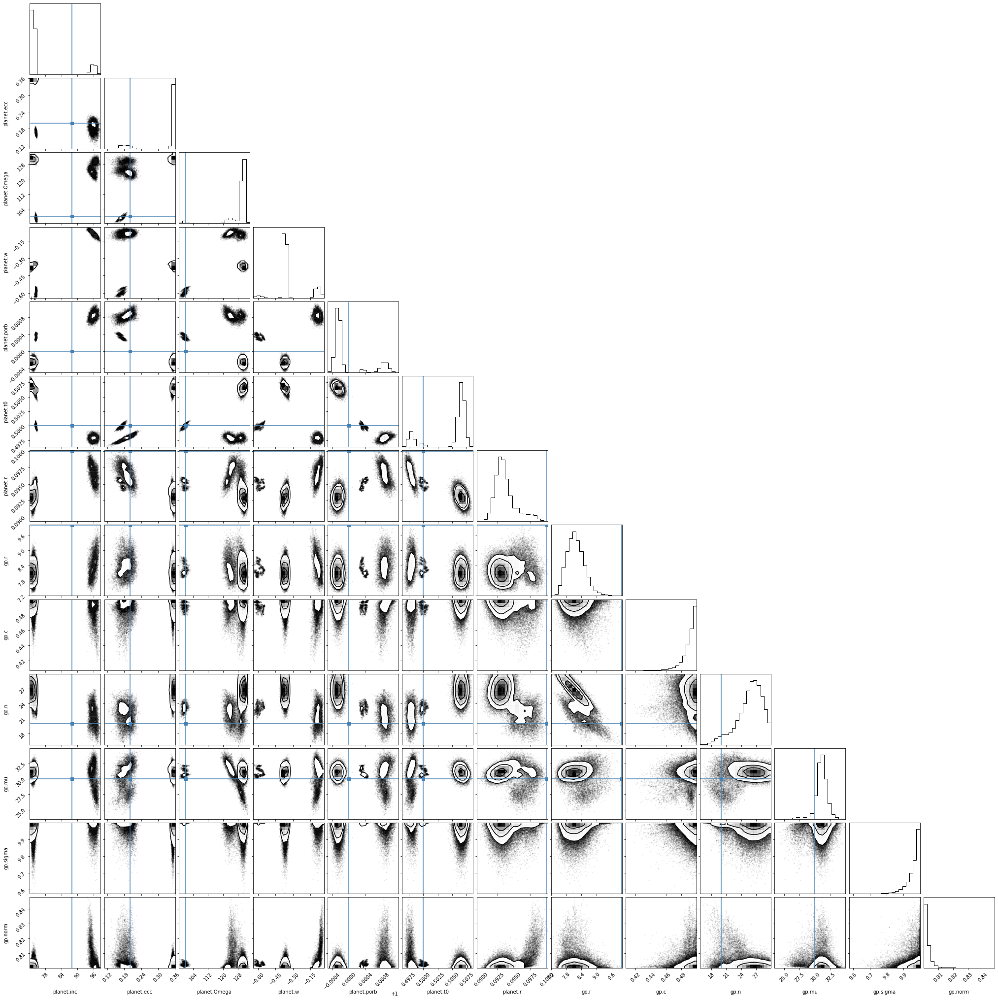

In [45]:
corner(np.array(samples), labels=free, truths=[params[x]["truth"] for x in free]);

In [66]:
samples.shape

(60000, 13)

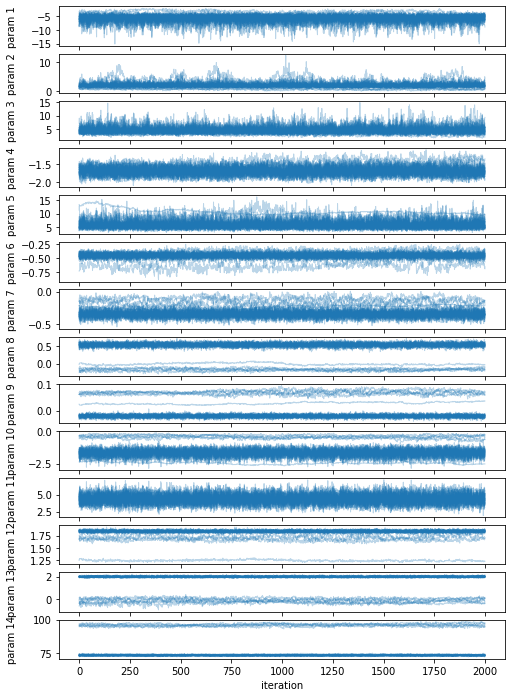

In [46]:
# Plot the walkers
fig, ax = plt.subplots(ndim, figsize=(8, 12), sharex=True)
for j in range(ndim):
    for k in range(nwalkers):
        ax[j].plot(sampler_new.chain[k, :, j], "C0-", lw=1, alpha=0.3)
    ax[j].set_ylabel("param {}".format(j + 1))
ax[-1].set_xlabel("iteration")
fig.align_ylabels(ax)
plt.show()

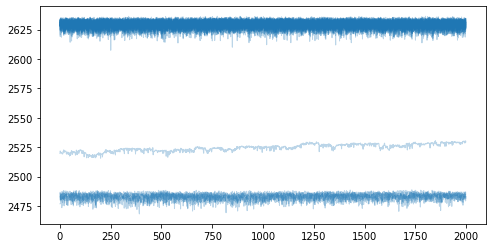

In [47]:
fig, ax = plt.subplots(1, figsize=(8, 4))
for k in range(nwalkers):
    plt.plot(sampler_new.lnprobability[k], "C0-", lw=1, alpha=0.3)

In [51]:
# az.from_pymc3(sampler_new);
az.to_netcdf(sampler_new,'longerlc_128000_gps.andplanets.nc');

In [86]:
az_trace = az.from_netcdf('longerlc_128000_gps.andplanets.nc')

array([[<Axes: title={'center': 'var_0'}>,
        <Axes: title={'center': 'var_0'}>],
       [<Axes: title={'center': 'var_1'}>,
        <Axes: title={'center': 'var_1'}>],
       [<Axes: title={'center': 'var_2'}>,
        <Axes: title={'center': 'var_2'}>],
       [<Axes: title={'center': 'var_3'}>,
        <Axes: title={'center': 'var_3'}>],
       [<Axes: title={'center': 'var_4'}>,
        <Axes: title={'center': 'var_4'}>],
       [<Axes: title={'center': 'var_5'}>,
        <Axes: title={'center': 'var_5'}>],
       [<Axes: title={'center': 'var_6'}>,
        <Axes: title={'center': 'var_6'}>],
       [<Axes: title={'center': 'var_7'}>,
        <Axes: title={'center': 'var_7'}>],
       [<Axes: title={'center': 'var_8'}>,
        <Axes: title={'center': 'var_8'}>],
       [<Axes: title={'center': 'var_9'}>,
        <Axes: title={'center': 'var_9'}>],
       [<Axes: title={'center': 'var_10'}>,
        <Axes: title={'center': 'var_10'}>],
       [<Axes: title={'center': 'var_11'}

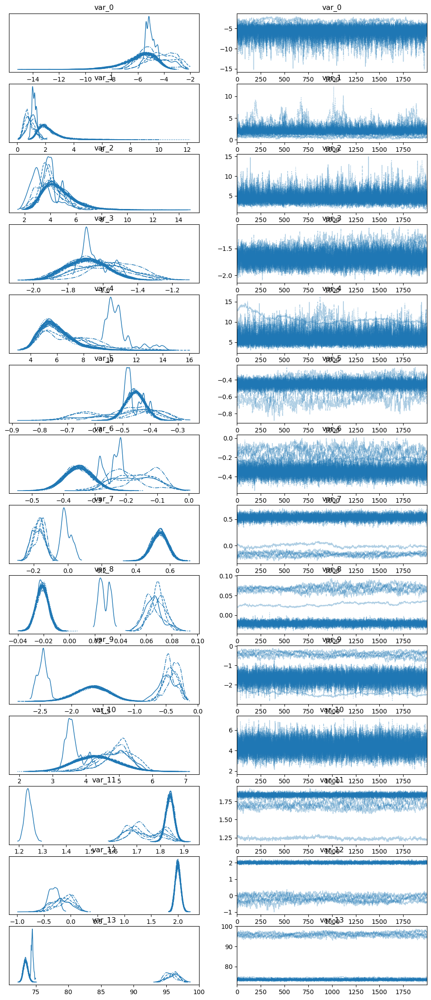

In [87]:
az.plot_trace(az_trace)

In [88]:
samples_fromfile = az_trace.to_dataframe()

In [89]:
samples_fromfile.columns

Index([                'chain',                  'draw',
        ('posterior', 'var_0'),  ('posterior', 'var_1'),
        ('posterior', 'var_2'),  ('posterior', 'var_3'),
        ('posterior', 'var_4'),  ('posterior', 'var_5'),
        ('posterior', 'var_6'),  ('posterior', 'var_7'),
        ('posterior', 'var_8'),  ('posterior', 'var_9'),
       ('posterior', 'var_10'), ('posterior', 'var_11'),
       ('posterior', 'var_12'), ('posterior', 'var_13'),
        ('sample_stats', 'lp')],
      dtype='object')

In [90]:
samples_fromfile = samples_fromfile.iloc[:, 2:16]

In [91]:
samples_fromfile

,"(posterior, var_0)","(posterior, var_1)","(posterior, var_2)","(posterior, var_3)","(posterior, var_4)","(posterior, var_5)","(posterior, var_6)","(posterior, var_7)","(posterior, var_8)","(posterior, var_9)","(posterior, var_10)","(posterior, var_11)","(posterior, var_12)","(posterior, var_13)"
0,-5.776045,1.646072,4.180052,-1.644706,3.790365,-0.451627,-0.325671,0.495082,-0.020669,-1.578370,4.172996,1.849441,1.949546,73.717553
1,-6.231087,1.663182,3.966552,-1.630564,3.723359,-0.446567,-0.314290,0.481600,-0.019243,-1.654011,4.402184,1.847007,1.949211,73.702100
2,-6.513984,2.011784,3.977129,-1.684756,5.168831,-0.485193,-0.354242,0.471743,-0.017446,-1.648206,4.359660,1.850599,1.943928,73.778675
3,-5.971422,2.198957,3.569442,-1.697433,6.113207,-0.511612,-0.354628,0.454316,-0.020809,-1.250481,3.317805,1.826470,1.988458,73.944777
4,-6.054156,2.069827,4.018345,-1.678016,6.605298,-0.507625,-0.351865,0.500041,-0.022154,-1.617204,4.192547,1.835543,2.016420,73.633921
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,-7.649130,2.026790,6.785421,-1.743122,5.664198,-0.415127,-0.328338,0.553862,-0.026048,-1.679840,4.455585,1.821373,1.966308,73.564789
59996,-6.824547,1.987829,3.266986,-1.649548,4.356621,-0.442718,-0.286152,0.507112,-0.024403,-1.844169,4.894388,1.838757,1.996523,73.693487
59997,-6.421059,1.699217,4.235258,-1.579763,5.539300,-0.420225,-0.298151,0.543316,-0.027608,-1.576985,4.098485,1.844684,2.043448,73.510418
59998,-6.546026,1.648733,3.437043,-1.554852,5.168025,-0.421962,-0.301933,0.545537,-0.023779,-1.652563,4.199969,1.836818,2.090449,73.393609


In [92]:
samples_fromfile.columns

Index([ ('posterior', 'var_0'),  ('posterior', 'var_1'),
        ('posterior', 'var_2'),  ('posterior', 'var_3'),
        ('posterior', 'var_4'),  ('posterior', 'var_5'),
        ('posterior', 'var_6'),  ('posterior', 'var_7'),
        ('posterior', 'var_8'),  ('posterior', 'var_9'),
       ('posterior', 'var_10'), ('posterior', 'var_11'),
       ('posterior', 'var_12'), ('posterior', 'var_13')],
      dtype='object')

In [93]:
samples_fromfile = mci.transform(samples_fromfile, varnames=free)

100%|██████████| 60000/60000 [1:23:00<00:00, 12.05it/s]  


In [115]:
use_ranges = [(78,92),(0.15,0.25),(97,103),(-0.04,0.04),(0.9995,1.001),(0.497,0.503),(0.0995,0.1001),(9.97,10.01),(0.09,0.408),(18,23),(27,32),(4,9.58),(0.8,1)]

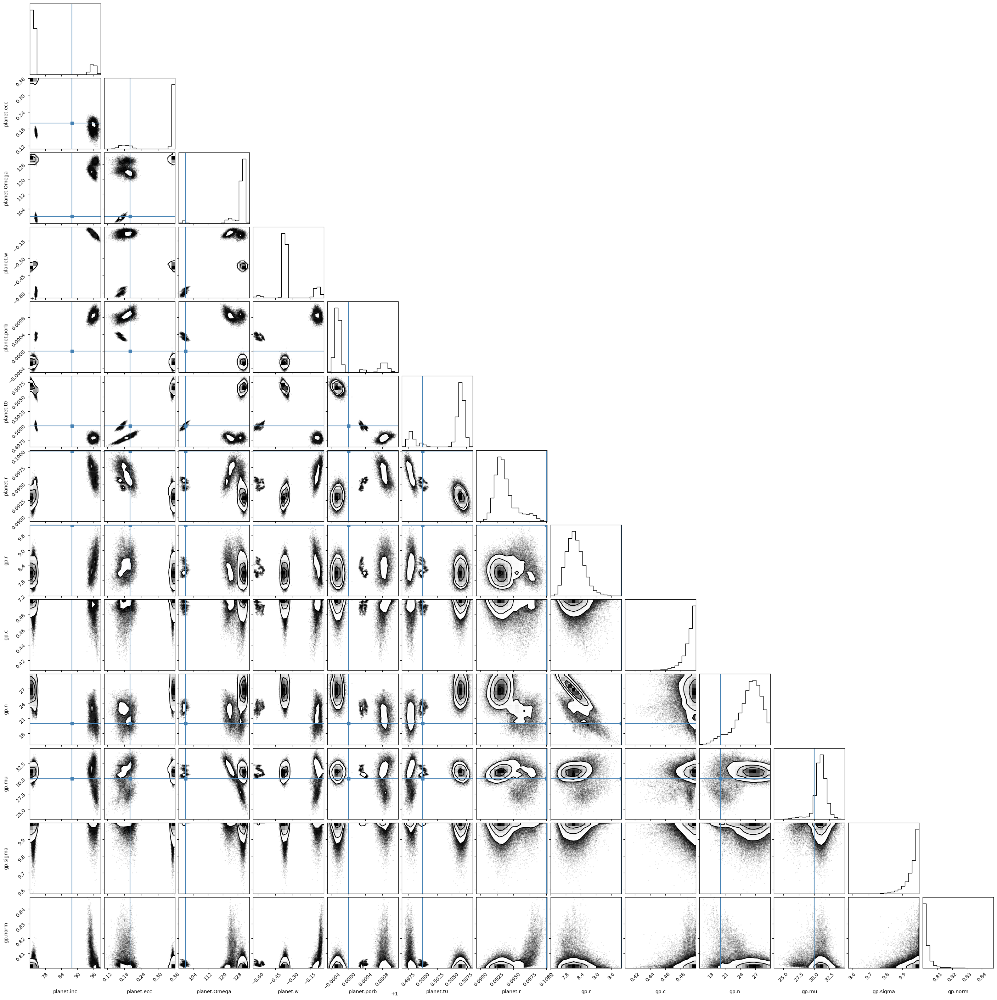

In [124]:
corner(np.array(samples_fromfile), labels=free, truths=[params[x]["truth"] for x in free],);

In [103]:
samples_fromfile[:,0]

array([73.71755335, 73.70210023, 73.77867539, ..., 73.51041818,
       73.39360905, 73.35955125])

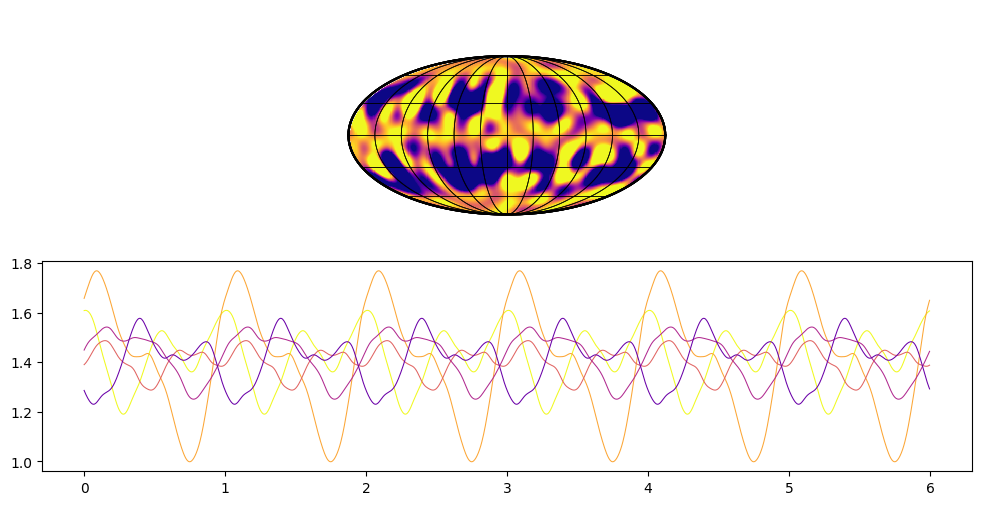

In [165]:
nsamples = 5
norm = Normalize(vmin=0.5, vmax=1.1)
cmap = plt.get_cmap("plasma_r")


map = starry.Map(15)

fig, ax = plt.subplots(
    2 ,
    figsize=(12, 6),
)


# Draw samples

sp = StarryProcess(
        mu=samples_fromfile[np.random.randint(0,samples_fromfile.shape[0]),10],
        sigma=samples_fromfile[np.random.randint(0,samples_fromfile.shape[0]),11],
        r=samples_fromfile[np.random.randint(0,samples_fromfile.shape[0]),7],
        c=samples_fromfile[np.random.randint(0,samples_fromfile.shape[0]),8],
        n=samples_fromfile[np.random.randint(0,samples_fromfile.shape[0]),9],
        marginalize_over_inclination=False,  
        normalized=False, 
    )

y = sp.sample_ylm(nsamples=nsamples).eval()

# Normalize so that the background photosphere
# has unit intensity (for plotting)
y[:, 0] += 1
y *= np.pi

map.inc = params["star.inc"]["truth"]


for k in range(nsamples):
    map[:, :] = y[k]
    map.show(ax=ax[0], projection="moll", norm=norm)
    ax[0].set_ylim(-1.5, 2.25)
    ax[0].set_rasterization_zorder(1)

    flux_rot = map.flux(theta=360.0 * t)
    flux_rot -= np.mean(flux)
    ax[1].plot(t, flux_rot.eval(), color=cmap(k/nsamples), lw=0.75)



Text(0, 0.5, 'Normalized Flux')

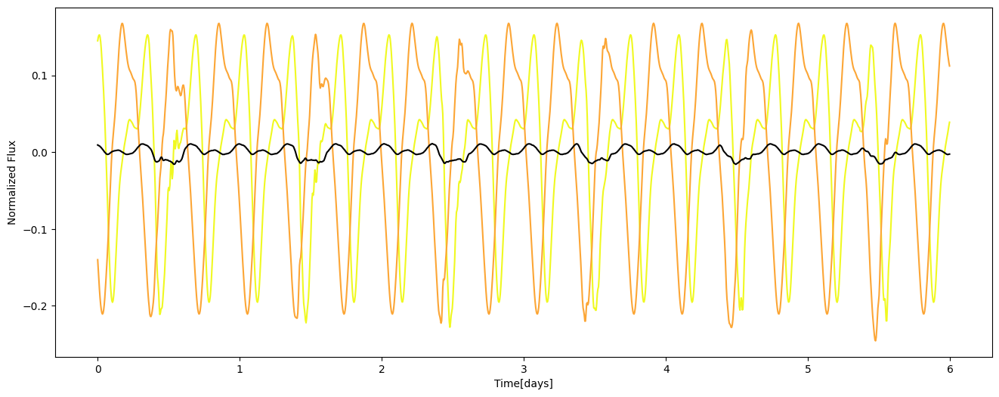

In [164]:
nsamples=2
map = starry.Map(15,2)

sp = StarryProcess(
        mu=samples_fromfile[np.random.randint(0,samples_fromfile.shape[0]),10],
        sigma=samples_fromfile[np.random.randint(0,samples_fromfile.shape[0]),11],
        r=samples_fromfile[np.random.randint(0,samples_fromfile.shape[0]),7],
        c=samples_fromfile[np.random.randint(0,samples_fromfile.shape[0]),8],
        n=samples_fromfile[np.random.randint(0,samples_fromfile.shape[0]),9],
        marginalize_over_inclination=False,  
        normalized=False, 
    )

y = sp.sample_ylm(nsamples=nsamples).eval()
fig, ax = plt.subplots(
    1,
    figsize=(16, 6),
)
# Normalize so that the background photosphere
# has unit intensity (for plotting)
y[:, 0] += 1

y *= np.pi
flux_sys=np.zeros((nsamples,len(t)))
map.inc = params["star.inc"]["truth"]
map[1] = params["star.u1"]["truth"]
map[2] = params["star.u2"]["truth"]


theta = (360 * t / params["star.prot"]["truth"]) % 360


for k in range(nsamples):
    star = starry.Primary(map, m=params["star.m"]["truth"]) 
    planet = starry.Secondary(
    starry.Map(),
        inc=samples_fromfile[np.random.randint(0,samples_fromfile.shape[0]),0],
        ecc=samples_fromfile[np.random.randint(0,samples_fromfile.shape[0]),1],
        Omega=samples_fromfile[np.random.randint(0,samples_fromfile.shape[0]),2],
        w=samples_fromfile[np.random.randint(0,samples_fromfile.shape[0]),3],
        porb=samples_fromfile[np.random.randint(0,samples_fromfile.shape[0]),4],
        t0=samples_fromfile[np.random.randint(0,samples_fromfile.shape[0]),5],
    )
    sys = starry.System(star, planet)
    xo, yo, zo = sys.position(t)
    xo = xo.eval()[1]
    yo = yo.eval()[1]
    zo = zo.eval()[1]

    map[:,:] = y[k]

    # Compute the light curve
    flux_sys = map.flux(theta=theta, xo=xo, yo=yo, zo=zo, ro=samples_fromfile[np.random.randint(0,samples_fromfile.shape[0]),6])

    # *** Normalize the flux
    flux_sys -= np.mean(flux_sys.eval())
    # flux_sys /= med_flux

    plt.plot(t, flux_sys.eval(), color=cmap(k/5))
    # plt.plot(t,mu_flux, color=cmap(k/5))
plt.plot(t,flux - np.mean(flux),'k')
plt.xlabel('Time[days]')
plt.ylabel('Normalized Flux')

    

# Dynesty

In [45]:
def ptform(u):  # defines our prior range

    x = np.zeros_like(u)
    
    x[0] = 180 * u[0]    # planet inclination range is from 0 to 180
    x[1] = 0.4 * u[1]  # planet ecc range is from 0 to 0.4
    x[2] = 360 * u[2] - 180  # Omega range is from -180 to 180
    x[3] = 360 * u[3] - 180       # w range is from -180 to 180
    x[4] = 0.05 * u[4] + 0.975       # porb range is from 0.975 to 1.025
    x[5] = 0.05 * u[5] + 0.475          # pt0 range is from 0.475 to 0.525
    x[6] = 0.08 * u[6] + 0.06
    x[7] = 20 * u[7] + 5
    x[8] = 0.49 * u[8] + 0.01
    x[9] = 29 * u[9] + 1
    x[10] = 80 * u[10]
    x[11] = 9 * u[11] + 1
    x[12] = 0.4 * u[12] + 0.8
    
    return np.flip(x)

In [60]:
import dynesty
import emcee

# Number of parameters
ndim = p0.shape[1]

# Run the chains
np.random.seed(0)
nsteps = 1000

# initialize our nested sampler
sampler = dynesty.NestedSampler(mci.logp, ptform, ndim, nlive=1000)
sampler.run_nested()

67920it [67:16:58,  3.57s/it, +1000 | bound: 436 | nc: 1 | ncall: 2223988 | eff(%):  3.100 | loglstar:   -inf < -3621.028 <    inf | logz: -3689.300 +/-  0.280 | dlogz:  0.001 >  1.009]


In [61]:
results = sampler.results

In [65]:
results.samples.shape

(68920, 14)

In [70]:
import arviz as az

In [75]:
az.to_netcdf(results.samples,'samples_dynesty_longlc_gpsandplanet.nc');

/opt/anaconda3/envs/starry-env/lib/python3.8/site-packages/arviz/data/base.py:220: UserWarning: More chains (68920) than draws (14). Passed array should have shape (chains, draws, *shape)
  warnings.warn(


In [154]:
dynesty_fromfile = az.from_netcdf('samples_dynesty_longlc_gpsandplanet.nc')

In [155]:
dynesty_fromfile = dynesty_fromfile.to_dataframe()

In [161]:
dynesty_fromfile[dynesty_fromfile['draw'] == 1]['x']

1         1.074931
15        0.979334
29        0.914920
43        0.876383
57        0.884402
            ...   
964811    0.806096
964825    0.802447
964839    0.803232
964853    0.805873
964867    0.804279
Name: x, Length: 68920, dtype: float64

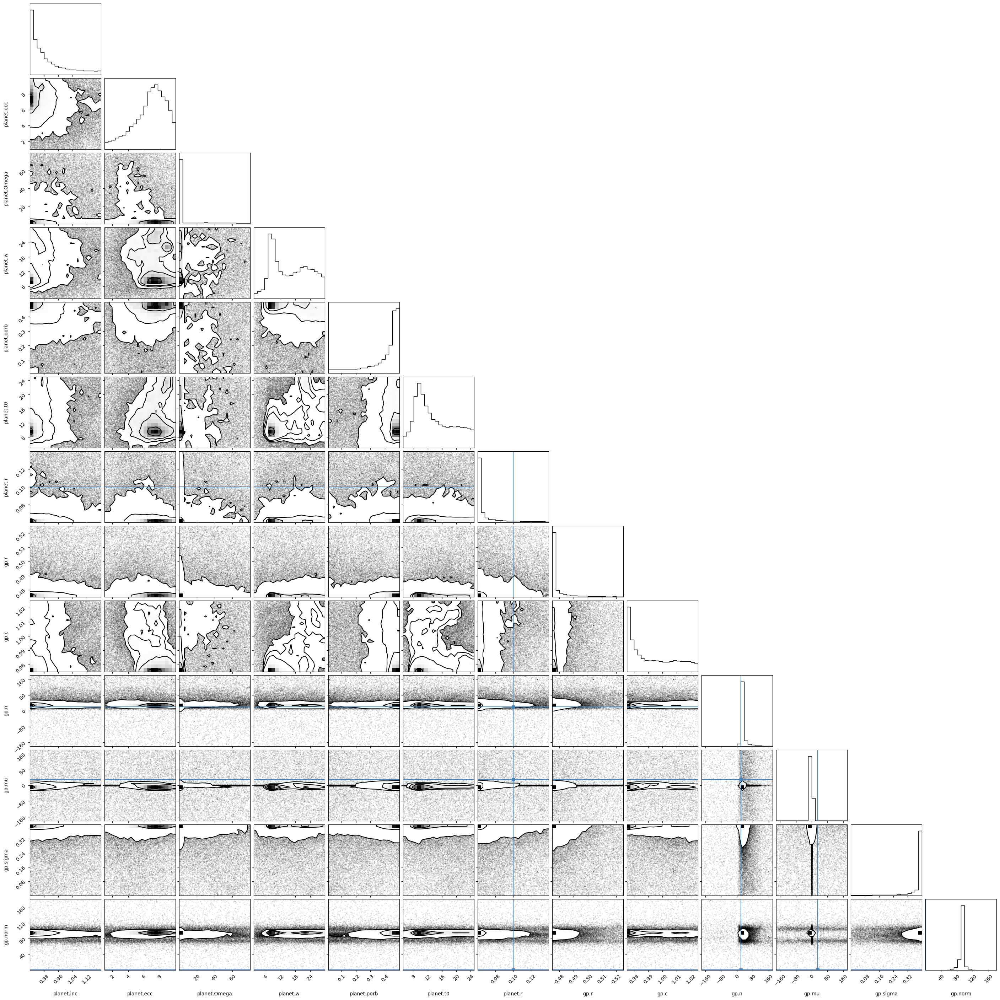

In [84]:
corner(results.samples[:,1:], labels=free, truths=[params[x]["truth"] for x in free],);

# Fixed period